# Case Study: Predicting Charging Demand - EV Data Intelligence Lead

# Exploratory analysis of existing EV stations

In [231]:
import pandas as pd
import numpy as np
import math
import matplotlib.pyplot as plt

In [96]:
# load dataset and drop all empty columns
charging_station = pd.read_csv('alt_fuel_stations (Nov 16 2024).csv', parse_dates=['Open Date']).dropna(axis=1, how='all', inplace=False)
charging_station.columns

C:\Users\gbooy\AppData\Local\Temp\ipykernel_9104\437179640.py:2: DtypeWarning: Columns (20,31,39,46,74) have mixed types. Specify dtype option on import or set low_memory=False.
  charging_station = pd.read_csv('alt_fuel_stations (Nov 16 2024).csv', parse_dates=['Open Date']).dropna(axis=1, how='all', inplace=False)


Index(['Fuel Type Code', 'Station Name', 'Street Address',
       'Intersection Directions', 'City', 'State', 'ZIP', 'Station Phone',
       'Status Code', 'Groups With Access Code', 'Access Days Time',
       'Cards Accepted', 'EV Level1 EVSE Num', 'EV Level2 EVSE Num',
       'EV DC Fast Count', 'EV Other Info', 'EV Network', 'EV Network Web',
       'Geocode Status', 'Latitude', 'Longitude', 'Date Last Confirmed', 'ID',
       'Updated At', 'Owner Type Code', 'Federal Agency ID',
       'Federal Agency Name', 'Open Date', 'EV Connector Types', 'Country',
       'Intersection Directions (French)', 'Access Days Time (French)',
       'Groups With Access Code (French)', 'Access Code', 'Access Detail Code',
       'Federal Agency Code', 'Facility Type', 'EV Pricing',
       'EV Pricing (French)', 'EV On-Site Renewable Source',
       'Restricted Access', 'NPS Unit Name', 'Maximum Vehicle Class',
       'EV Workplace Charging', 'Funding Sources'],
      dtype='object')

#### HeatMap on Existing EV Stations Across the US 

In [232]:
#create list of coordinate pairs using list comprehension
coord_list = [(lat, lon) for lat, lon in zip(charging_stations.Latitude, charging_stations.Longitude) if not math.isnan(lat) and not math.isnan(lon)]

In [239]:
from folium import plugins

m = folium.Map(location=(32.899470, -117.243000), tiles='Cartodb dark matter', zoom_start=4)
plugins.HeatMap(coord_list, radius=20).add_to(m)

m

In [97]:
#filter columns
charging_stations = charging_station[charging_station['Country'].isin(['US'])].filter(['ID','Station Name','Street Address', 'Intersection Directions', 'City','State','ZIP','EV Level1 EVSE Num','EV Level2 EVSE Num','EV DC Fast Count','EV Network','Latitude','Longitude','Open Date','EV Connector Types','Facility Type','EV Pricing','EV Workplace Charging'])
charging_stations.head()

,ID,Station Name,Street Address,Intersection Directions,City,State,ZIP,EV Level1 EVSE Num,EV Level2 EVSE Num,EV DC Fast Count,EV Network,Latitude,Longitude,Open Date,EV Connector Types,Facility Type,EV Pricing,EV Workplace Charging
0,1523,Los Angeles Convention Center,1201 S Figueroa St,West hall and South hall,Los Angeles,CA,ZCTA5 90015,NaN,7.0,NaN,Non-Networked,34.040539,-118.271387,1995-08-30,J1772,PARKING_GARAGE,Free; parking fee,False
1,6355,Scripps Green Hospital,10666 N Torrey Pines Rd,"Patient Parking Structure, level G",La Jolla,CA,ZCTA5 92037,NaN,1.0,NaN,Non-Networked,32.899470,-117.243000,1997-07-30,J1772,HOSPITAL,Free; parking fee,False
2,6405,Galpin Motors,15421 Roscoe Blvd,NaN,Sepulveda,CA,ZCTA5 91343,NaN,2.0,NaN,Non-Networked,34.221665,-118.468371,2012-12-11,J1772,CAR_DEALER,NaN,False
3,6425,Galleria at Tyler,1299 Galleria at Tyler,NaN,Riverside,CA,ZCTA5 92503,NaN,4.0,NaN,Non-Networked,33.909914,-117.459053,1997-08-30,J1772,SHOPPING_MALL,Free,False
4,6505,City of Pasadena - Holly Street Garage,150 E Holly St,NaN,Pasadena,CA,ZCTA5 91103,NaN,16.0,NaN,Non-Networked,34.147620,-118.147111,1997-08-30,J1772,PARKING_GARAGE,Free,False


In [98]:
charging_stations.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 69042 entries, 0 to 81385
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   ID                       69042 non-null  int64         
 1   Station Name             69041 non-null  object        
 2   Street Address           69042 non-null  object        
 3   Intersection Directions  21574 non-null  object        
 4   City                     69037 non-null  object        
 5   State                    69042 non-null  object        
 6   ZIP                      69042 non-null  object        
 7   EV Level1 EVSE Num       178 non-null    float64       
 8   EV Level2 EVSE Num       58763 non-null  float64       
 9   EV DC Fast Count         11631 non-null  float64       
 10  EV Network               69042 non-null  object        
 11  Latitude                 69042 non-null  float64       
 12  Longitude                69042 n

In [99]:
# identify top 5 states with the most stations
charging_stations.groupby('State')['ID'].count().sort_values(ascending=False).head()

State
CA    16575
NY     4488
TX     3630
FL     3569
MA     3317
Name: ID, dtype: int64

In [100]:
# identify top 5 ZIPs with the most stations
charging_stations.groupby('ZIP')['State'].count().sort_values(ascending=False).head()

ZIP
ZCTA5 95054    298
ZCTA5 94025    298
ZCTA5 92618    283
ZCTA5 98121    169
ZCTA5 98004    168
Name: State, dtype: int64

In [101]:
# identify where most stations are installed
charging_stations['Facility Type'].value_counts().head()

HOTEL              3069
CAR_DEALER         1903
PARKING_LOT        1334
PUBLIC             1140
SHOPPING_CENTER     688
Name: Facility Type, dtype: int64

In [102]:
# identify other places where stations are installed
charging_stations['Facility Type'].unique()

array(['PARKING_GARAGE', 'HOSPITAL', 'CAR_DEALER', 'SHOPPING_MALL',
       'GROCERY', 'HOTEL', 'AIRPORT', nan, 'OFFICE_BLDG', 'MUNI_GOV',
       'SHOPPING_CENTER', 'COLLEGE_CAMPUS', 'PARKING_LOT', 'PARK',
       'LIBRARY', 'REC_SPORTS_FACILITY', 'TRAVEL_CENTER',
       'CONVENIENCE_STORE', 'MUSEUM', 'PAY_LOT', 'PLACE_OF_WORSHIP',
       'PAY_GARAGE', 'RESTAURANT', 'OTHER_ENTERTAINMENT', 'UTILITY',
       'B_AND_B', 'STREET_PARKING', 'GAS_STATION', 'FLEET_GARAGE',
       'RESEARCH_FACILITY', 'BREWERY_DISTILLERY_WINERY', 'STORAGE',
       'STATE_GOV', 'INN', 'COOP', 'CAMPGROUND', 'NATL_PARK',
       'CONVENTION_CENTER', 'SCHOOL', 'FIRE_STATION',
       'STANDALONE_STATION', 'MULTI_UNIT_DWELLING', 'RV_PARK',
       'AUTO_REPAIR', 'ARENA', 'BANK', 'REST_STOP', 'OTHER', 'FED_GOV',
       'CARWASH', 'HARDWARE_STORE', 'TRUCK_STOP', 'STADIUM', 'FACTORY',
       'MOTOR_POOL', 'RENTAL_CAR_RETURN', 'RETAIL', 'FUEL_RESELLER',
       'PUBLIC', 'WORKPLACE', 'PHARMACY'], dtype=object)

In [103]:
# which connection types are mostly installed 
charging_stations['EV Connector Types'].value_counts().head()

J1772                 52658
CHADEMO J1772COMBO     4711
TESLA                  4637
J1772COMBO             2694
J1772 TESLA            2346
Name: EV Connector Types, dtype: int64

In [104]:
# create new column total EV chargers
all_chargers = ['EV Level1 EVSE Num', 'EV Level2 EVSE Num', 'EV DC Fast Count']
charging_stations['Total EV Chargers'] = charging_stations[all_chargers].sum(axis=1)

In [105]:
# view states with most chargers across level1, level2, DCFC and total
charging_stations.groupby('State')['EV Level1 EVSE Num', 'EV Level2 EVSE Num', 'EV DC Fast Count', 'Total EV Chargers'].sum().sort_values(by='Total EV Chargers', ascending=False).head()

C:\Users\gbooy\AppData\Local\Temp\ipykernel_9104\1816618382.py:2: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  charging_stations.groupby('State')['EV Level1 EVSE Num', 'EV Level2 EVSE Num', 'EV DC Fast Count', 'Total EV Chargers'].sum().sort_values(by='Total EV Chargers', ascending=False).head()


,EV Level1 EVSE Num,EV Level2 EVSE Num,EV DC Fast Count,Total EV Chargers
State,,,,
CA,232.0,35743.0,12849.0,48824.0
NY,11.0,13768.0,1896.0,15675.0
FL,22.0,7962.0,2862.0,10846.0
TX,0.0,7335.0,3076.0,10411.0
MA,21.0,7123.0,1032.0,8176.0


##### California leads the way in electric station infrastructure. Not only do they have the most EV chargers, they also have the most level 1, level 2 and DCFC

In [106]:
charging_stations.groupby('State')['EV Level1 EVSE Num'].sum().sort_values(ascending=False).head()

State
CA    232.0
GA    196.0
CO     55.0
VA     30.0
OR     28.0
Name: EV Level1 EVSE Num, dtype: float64

In [107]:
charging_stations.groupby('State')['EV Level2 EVSE Num'].sum().sort_values(ascending=False).head()

State
CA    35743.0
NY    13768.0
FL     7962.0
TX     7335.0
MA     7123.0
Name: EV Level2 EVSE Num, dtype: float64

In [108]:
charging_stations.groupby('State')['EV DC Fast Count'].sum().sort_values(ascending=False).head()

State
CA    12849.0
TX     3076.0
FL     2862.0
NY     1896.0
WA     1464.0
Name: EV DC Fast Count, dtype: float64

# Treating of missing values

In [109]:
# EV Level1 EVSE Num, EV Level2 EVSE Num, EV DC Fast Count, Facility Type, EV Pricing all have considerable null values. We will fill the EV Level1 EVSE Num, EV Level2 EVSE Num, EV DC Fast Count with zero.
charging_stations.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 69042 entries, 0 to 81385
Data columns (total 19 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   ID                       69042 non-null  int64         
 1   Station Name             69041 non-null  object        
 2   Street Address           69042 non-null  object        
 3   Intersection Directions  21574 non-null  object        
 4   City                     69037 non-null  object        
 5   State                    69042 non-null  object        
 6   ZIP                      69042 non-null  object        
 7   EV Level1 EVSE Num       178 non-null    float64       
 8   EV Level2 EVSE Num       58763 non-null  float64       
 9   EV DC Fast Count         11631 non-null  float64       
 10  EV Network               69042 non-null  object        
 11  Latitude                 69042 non-null  float64       
 12  Longitude                69042 n

In [110]:
# fill nas with zero
charging_stations[['EV Level1 EVSE Num', 'EV Level2 EVSE Num', 'EV DC Fast Count']].fillna(0, inplace=True)

C:\Users\gbooy\AppData\Local\Temp\ipykernel_9104\441943420.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  charging_stations[['EV Level1 EVSE Num', 'EV Level2 EVSE Num', 'EV DC Fast Count']].fillna(0, inplace=True)


In [111]:
# For the facility type column we would use a model to predict the null values. We will use street name, street address, city and intersection directions to train a RandomForestClassifier model

from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import FunctionTransformer


# Drop rows with missing Facility Type
df = charging_stations.dropna(subset=["Facility Type"])

# Combine relevant textual features and fill na with empty string
df["Combined Features"] = df[['Station Name', 'Street Address', 'City', 'Intersection Directions']].fillna("").agg(" ".join, axis=1)

# Split into features and target
X = df[["Combined Features"]]
y = df["Facility Type"]

# Split into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define a pipeline for text-based feature extraction and modeling
pipeline = Pipeline([
    ("tfidf", TfidfVectorizer()),  # Text vectorization
    ("classifier", RandomForestClassifier(random_state=42))  # Classification model
])

# Train the model
pipeline.fit(X_train["Combined Features"], y_train)

# Evaluate the model
y_pred = pipeline.predict(X_test["Combined Features"])
print(classification_report(y_test, y_pred))


C:\Users\gbooy\AppData\Local\Temp\ipykernel_9104\3373619709.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["Combined Features"] = df[['Station Name', 'Street Address', 'City', 'Intersection Directions']].fillna("").agg(" ".join, axis=1)


                           precision    recall  f1-score   support

                  AIRPORT       0.89      0.74      0.81        34
                    ARENA       0.00      0.00      0.00         2
              AUTO_REPAIR       0.00      0.00      0.00         7
                     BANK       0.89      0.81      0.85        21
BREWERY_DISTILLERY_WINERY       0.85      0.65      0.74        52
                  B_AND_B       0.95      0.86      0.90        22
               CAMPGROUND       1.00      0.25      0.40         8
               CAR_DEALER       0.93      0.96      0.94       373
           COLLEGE_CAMPUS       0.85      0.90      0.88        78
        CONVENIENCE_STORE       0.90      0.43      0.58        42
        CONVENTION_CENTER       0.00      0.00      0.00         6
                     COOP       0.50      1.00      0.67         3
                  FED_GOV       0.00      0.00      0.00         5
             FIRE_STATION       1.00      0.67      0.80     

C:\Users\gbooy\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\gbooy\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\gbooy\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\gbooy\anaconda3\lib\site-packages\sklearn\metrics\_cla

In [112]:
# Save the model for future use
import joblib
model_path = "facility_type_model.pkl"
joblib.dump(pipeline, model_path)
print(f"Model saved to {model_path}")

Model saved to facility_type_model.pkl


### 1. Precision, Recall, and F1-Score Explained
Precision measures how many of the predicted positive instances (for a given class) were actually correct. In other words, out of all the predicted instances for a particular class, how many are truly part of that class.
Recall measures how many of the actual positive instances were correctly identified. It tells us how well the model identified all instances of a particular class. F1-Score is the harmonic mean of precision and recall. It balances both precision and recall, with values closer to 1 indicating better performance.


### 2. Interpreting the Result for Each Class
Each row corresponds to a class (e.g., "AIRPORT", "BANK", "CARWASH") and reports the model's performance in terms of precision, recall, and F1-score: Classes with good performance (high values):
For example, "CAR_DEALER" has high precision (0.91), recall (0.95), and F1-score (0.93), which means the model is very good at identifying car dealerships and almost never mislabels them.

"RESEARCH_FACILITY" has perfect scores across the board because the model correctly predicts this rare class every time (only 1 sample).
Classes with poor performance (low values):"ARENA", "AUTO_REPAIR", and "CARWASH" have precision and recall scores of 0.00, meaning the model was unable to correctly predict any instances for these classes (i.e., the model either predicted these classes incorrectly or never predicted them at all).

"FUEL_RESELLER", "FED_GOV", "RETAIL", etc., also show low scores, which indicates these classes are either underrepresented or difficult for the model to distinguish.
Classes with skewed performance:
"CAMPGROUND" has a high precision of 1.00 but low recall (0.36). This means the model is good at predicting campgrounds when it makes predictions, but it misses many actual campgrounds (false negatives).
"HOTEL" has a high recall (0.95), meaning the model catches most hotels but with a slightly lower precision (0.79), indicating some of its predictions for hotels may be incorrect.

### 3. Accuracy and Aggregated Metrics
Accuracy (0.68): This is the overall percentage of correct predictions. It tells us how often the model correctly predicted the class across all instances. The accuracy is reasonable, but considering the class imbalance and skewed performance for certain classes, accuracy might not be the best metric for evaluating performance here.

Macro Average: 
Precision: 0.53: The average precision across all classes. Recall: 0.40: The average recall across all classes. F1-Score: 0.43: The average F1-score across all classes. These averages are calculated without accounting for class imbalance, meaning each class is weighted equally. The macro average is generally lower when there are many underperforming or underrepresented classes.

Weighted Average:
Precision: 0.71: The weighted precision, which accounts for the number of instances in each class, is higher than the macro average. This suggests that the model performs better on the more frequent classes.
Recall: 0.69: Similarly, the recall is higher in the weighted average, again reflecting better performance on more frequent classes.
F1-Score: 0.68: The weighted F1-score also reflects this better performance for larger classes.

### 4. Reasons for Low Performance in Some Classes
Class Imbalance: Many of the categories (e.g., "FUEL_RESELLER", "CARWASH", "RETAIL") have very few samples or are very difficult for the model to distinguish, which could explain why they have very low precision, recall, and F1-scores. 

Underrepresented Classes: Some classes have only one or a few instances (e.g., "STADIUM" with 1 instance, "FED_GOV" with 3), making it difficult for the model to learn these classes effectively.
Misclassification: The model might be confusing certain classes, especially if they are similar or have overlapping features.

### 5. Suggestions for Improving Performance

We won't be improving this model as the facility type is not a key feature in determining EV station location. We will use the model to fill the missing value in the facility column and proceed with other aspect of this analysis.

However to improve this model’s performance, especially for underperforming classes: Address Class Imbalance: You can use techniques like oversampling the minority classes (e.g., using SMOTE) or undersampling the majority classes to make the model more sensitive to rare classes.

Adjust Class Weights: When training the model, adjusting class weights to penalize misclassifications in underrepresented classes might help improve performance for those classes. We can also collect more Data: especially for certain classes that are underrepresented, gathering more data for those classes can improve the model’s ability to learn and generalize for those categories.

Fine-Tuning the Model: Experimenting with different models (e.g., random forests, neural networks) and hyperparameter tuning can help improve overall performance.

In [113]:
# Using the model to predict missing Facility Types
import joblib

predict_station_df = charging_stations

# Load the trained model
model_path = "facility_type_model.pkl"
pipeline = joblib.load(model_path)

# Fill missing values in "Facility Type"
predict_station_df["Facility Type"] = predict_station_df["Facility Type"].fillna("")

# Combine relevant textual features
predict_station_df["Combined Features"] = predict_station_df[['Station Name', 'Street Address', 'City', 'Intersection Directions']].fillna("").agg(" ".join, axis=1)

# Identify rows with missing Facility Type
missing_facility_type = predict_station_df[predict_station_df["Facility Type"] == ""]

# Predict missing Facility Type values using the trained model
predicted_facility_types = pipeline.predict(missing_facility_type["Combined Features"])

# Fill the missing Facility Type values with the predicted values
predict_station_df.loc[predict_station_df["Facility Type"] == "", "Facility Type"] = predicted_facility_types


In [114]:
# Save the updated DataFrame to a new CSV file
output_file_path = "stations_with_facility_types_predictions.csv"
predict_station_df.to_csv(output_file_path, index=False)

print(f"Predictions for missing Facility Type values have been made and saved to {output_file_path}")

Predictions for missing Facility Type values have been made and saved to stations_with_facility_types_predictions.csv


## Calculating station density and distance to closest station

In [115]:
# Load the updated dataset
station_df = predict_station_df.filter(['ID','Station Name','Street Address','City','State','ZIP','EV Level1 EVSE Num','EV Level2 EVSE Num','EV DC Fast Count','EV Network','Latitude','Longitude','Open Date','EV Connector Types','Facility Type','EV Pricing','EV Workplace Charging'])

In [116]:
# Using BallTree approach to calculate station density
# Haversine Metric: The haversine formula calculates distances on a sphere. By using radians, it avoids the complexity of geodesic distance calculations.
# Radius Filtering: Only stations within the given radius (e.g., 10 km) are considered for density calculations.
# Station Density: The number of neighboring stations (excluding the station itself)

from sklearn.neighbors import BallTree

# Filter to California to reduce computational demand
#df = df[df['State'] == 'CA']

# Convert Latitude and Longitude to radians for haversine distance
station_df['Latitude_rad'] = np.radians(station_df['Latitude'])
station_df['Longitude_rad'] = np.radians(station_df['Longitude'])

# Create a BallTree using Latitude and Longitude
coords = station_df[['Latitude_rad', 'Longitude_rad']].values
tree = BallTree(coords, metric='haversine')

# Define Earth's radius in kilometers
earth_radius_km = 6371.0

# Initialize lists for nearest station distance and name
nearest_distances = []
nearest_station_names = []

# Calculate station density and nearest station for each station
station_density = []
for i, coord in enumerate(coords):
    # Query all stations within a search radius
    indices = tree.query_radius([coord], r=10 / earth_radius_km)[0]  # 10 km radius
    
    # Calculate density (exclude the station itself)
    density = len(indices) - 1
    station_density.append(density)

    # Query for the nearest station
    dist, idx = tree.query([coord], k=2)  # k=2 to exclude the station itself
    nearest_distance = dist[0][1] * earth_radius_km  # Convert distance to kilometers
    nearest_station_index = idx[0][1]
    
    # Add nearest station details
    nearest_distances.append(nearest_distance)
    nearest_station_names.append(station_df.iloc[nearest_station_index]['Station Name'])

# Add new columns to the DataFrame
station_df['Station Density'] = station_density
station_df['Nearest Station Distance (km)'] = nearest_distances
station_df['Nearest Station Name'] = nearest_station_names

# Drop temporary radian columns
station_df.drop(['Latitude_rad', 'Longitude_rad'], axis=1, inplace=True)

In [117]:
station_df.head(2)

,ID,Station Name,Street Address,City,State,ZIP,EV Level1 EVSE Num,EV Level2 EVSE Num,EV DC Fast Count,EV Network,Latitude,Longitude,Open Date,EV Connector Types,Facility Type,EV Pricing,EV Workplace Charging,Station Density,Nearest Station Distance (km),Nearest Station Name
0,1523,Los Angeles Convention Center,1201 S Figueroa St,Los Angeles,CA,ZCTA5 90015,NaN,7.0,NaN,Non-Networked,34.040539,-118.271387,1995-08-30,J1772,PARKING_GARAGE,Free; parking fee,False,788,0.287402,ESSEX AVANT STATION 2
1,6355,Scripps Green Hospital,10666 N Torrey Pines Rd,La Jolla,CA,ZCTA5 92037,NaN,1.0,NaN,Non-Networked,32.899470,-117.243000,1997-07-30,J1772,HOSPITAL,Free; parking fee,False,301,0.168504,SCRIPPS HEALTH SCRIPPS TP


In [118]:
# Example: Save results for further analysis
df.to_csv("station_density_california.csv", index=False)

# Display results
print(df[['Station Name', 'Station Density']].head())


KeyError: "['Station Density'] not in index"

## Calculating Urban Proximity: Focus on California to reduce computational demand

In [119]:
# Load the urban center dataset
file_path = "Urban Centers.csv"
urban_df = pd.read_csv(file_path)

urban_df.head(5)

,Place Name,Latitude,Longitude,Type,Center,State
0,"Downtown Los Angeles, CA, USA",34.044727,-118.249283,Urban,Districts,CA
1,"Charlestown, MA, USA",42.379822,-71.064941,Urban,Districts,MA
2,"Watts, Los Angeles, CA, USA",33.943203,-118.247772,Urban,Districts,CA
3,"Stony Brook, NY, USA",40.902771,-73.133850,Urban,Districts,NY
4,"Port Washington, NY, USA",40.827454,-73.699722,Urban,Districts,NY


In [120]:
# filter only urban centers in califonia
california_urban_df = urban_df[urban_df['State'] == 'CA']
california_urban_df.head(5)

,Place Name,Latitude,Longitude,Type,Center,State
0,"Downtown Los Angeles, CA, USA",34.044727,-118.249283,Urban,Districts,CA
2,"Watts, Los Angeles, CA, USA",33.943203,-118.247772,Urban,Districts,CA
8,"Venice, Los Angeles, CA, USA",33.988270,-118.472023,Urban,Districts,CA
10,"Lake Los Angeles, CA, the US",34.617779,-117.833611,Urban,Districts,CA
16,"Tujunga, Los Angeles, CA, USA",34.263302,-118.302711,Urban,Districts,CA


In [121]:
#filter EV stations in california
califonia_station_df = station_df[station_df['State'] == 'CA']
califonia_station_df.head(5)

,ID,Station Name,Street Address,City,State,ZIP,EV Level1 EVSE Num,EV Level2 EVSE Num,EV DC Fast Count,EV Network,Latitude,Longitude,Open Date,EV Connector Types,Facility Type,EV Pricing,EV Workplace Charging,Station Density,Nearest Station Distance (km),Nearest Station Name
0,1523,Los Angeles Convention Center,1201 S Figueroa St,Los Angeles,CA,ZCTA5 90015,NaN,7.0,NaN,Non-Networked,34.040539,-118.271387,1995-08-30,J1772,PARKING_GARAGE,Free; parking fee,False,788,0.287402,ESSEX AVANT STATION 2
1,6355,Scripps Green Hospital,10666 N Torrey Pines Rd,La Jolla,CA,ZCTA5 92037,NaN,1.0,NaN,Non-Networked,32.899470,-117.243000,1997-07-30,J1772,HOSPITAL,Free; parking fee,False,301,0.168504,SCRIPPS HEALTH SCRIPPS TP
2,6405,Galpin Motors,15421 Roscoe Blvd,Sepulveda,CA,ZCTA5 91343,NaN,2.0,NaN,Non-Networked,34.221665,-118.468371,2012-12-11,J1772,CAR_DEALER,NaN,False,314,0.110214,15475 W ROSCOE BLVD
3,6425,Galleria at Tyler,1299 Galleria at Tyler,Riverside,CA,ZCTA5 92503,NaN,4.0,NaN,Non-Networked,33.909914,-117.459053,1997-08-30,J1772,SHOPPING_MALL,Free,False,56,0.192488,Galleria at Tyler Southeast Entrance
4,6505,City of Pasadena - Holly Street Garage,150 E Holly St,Pasadena,CA,ZCTA5 91103,NaN,16.0,NaN,Non-Networked,34.147620,-118.147111,1997-08-30,J1772,PARKING_GARAGE,Free,False,195,0.000000,City of Pasadena - Holly Street Garage


In [122]:
# Convert latitude and longitude to radians for geodesic distance calculation
california_urban_df['Latitude_rad'] = np.radians(california_urban_df['Latitude'])
california_urban_df['Longitude_rad'] = np.radians(california_urban_df['Longitude'])


# Convert station coordinates to radians
califonia_station_df['Latitude_rad'] = np.radians(califonia_station_df['Latitude'])
califonia_station_df['Longitude_rad'] = np.radians(califonia_station_df['Longitude'])

# Create a BallTree using urban centers' latitude and longitude
urban_coords = california_urban_df[['Latitude_rad', 'Longitude_rad']].values
tree = BallTree(urban_coords, metric='haversine')

# Calculate the distance from each station to the nearest urban center
station_coords = califonia_station_df[['Latitude_rad', 'Longitude_rad']].values
distances, indices = tree.query(station_coords, k=1)

# Add the nearest urban center and the distance to the DataFrame
califonia_station_df['Nearest Urban Center'] = california_urban_df.iloc[indices.flatten()]['Place Name'].values
califonia_station_df['Distance to Nearest Urban Center (km)'] = distances.flatten() * 6371  # Convert from radians to kilometers

# Drop temporary radian columns
califonia_station_df.drop(['Latitude_rad', 'Longitude_rad'], axis=1, inplace=True)

C:\Users\gbooy\AppData\Local\Temp\ipykernel_9104\802966973.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  california_urban_df['Latitude_rad'] = np.radians(california_urban_df['Latitude'])
C:\Users\gbooy\AppData\Local\Temp\ipykernel_9104\802966973.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  california_urban_df['Longitude_rad'] = np.radians(california_urban_df['Longitude'])
C:\Users\gbooy\AppData\Local\Temp\ipykernel_9104\802966973.py:7: SettingWithCopyWarning: 
A value is trying to be set on a c

In [123]:
# Show the updated stations data with proximity information
califonia_station_df.head(2)

,ID,Station Name,Street Address,City,State,ZIP,EV Level1 EVSE Num,EV Level2 EVSE Num,EV DC Fast Count,EV Network,...,Open Date,EV Connector Types,Facility Type,EV Pricing,EV Workplace Charging,Station Density,Nearest Station Distance (km),Nearest Station Name,Nearest Urban Center,Distance to Nearest Urban Center (km)
0,1523,Los Angeles Convention Center,1201 S Figueroa St,Los Angeles,CA,ZCTA5 90015,NaN,7.0,NaN,Non-Networked,...,1995-08-30,J1772,PARKING_GARAGE,Free; parking fee,False,788,0.287402,ESSEX AVANT STATION 2,"Downtown Los Angeles, CA, USA",2.089191
1,6355,Scripps Green Hospital,10666 N Torrey Pines Rd,La Jolla,CA,ZCTA5 92037,NaN,1.0,NaN,Non-Networked,...,1997-07-30,J1772,HOSPITAL,Free; parking fee,False,301,0.168504,SCRIPPS HEALTH SCRIPPS TP,"La Jolla, CA, USA",6.464255


In [124]:
# Save the result to a CSV file
califonia_station_df_output_path = "calc_centers.csv"
califonia_station_df.to_csv(califonia_station_df_output_path, index=False)

print(f"califonia_station_df_output_path {califonia_station_df_output_path}")


califonia_station_df_output_path calc_centers.csv


## Identifying Underserved Areas

#### Locations with station density below the 20th percentile are marked as underserved using the Is_Underserved column.

We can use clustering with DBSCAN: DBSCAN (Density-Based Spatial Clustering of Applications with Noise) to group underserved locations into clusters for better visualization and prioritization.

In [127]:
from sklearn.cluster import DBSCAN

# Identify underserved areas
# Define thresholds for underserved areas (e.g., low density, far from urban centers)
low_density_threshold = califonia_station_df['Station Density'].quantile(0.2)  # Bottom 20%
califonia_station_df['Is_Underserved'] = califonia_station_df['Station Density'] <= low_density_threshold

# Define Earth's radius in kilometers
earth_radius_km = 6371.0

# Specify a search radius in kilometers (e.g., 10 km)
radius_km = 10

# Convert the radius to radians
radius_rad = radius_km / earth_radius_km

# Use DBSCAN to find clusters of underserved areas
underserved_coords = califonia_station_df[califonia_station_df['Is_Underserved']][['Latitude', 'Longitude']].values
dbscan = DBSCAN(eps=radius_rad, min_samples=2, metric='haversine')  # eps in radians
califonia_station_df['Underserved_Cluster'] = -1  # Default cluster ID for non-underserved points

if len(underserved_coords) > 0:
    clusters = dbscan.fit_predict(np.radians(underserved_coords))
    califonia_station_df.loc[califonia_station_df['Is_Underserved'], 'Underserved_Cluster'] = clusters

# Filter for underserved clusters only
underserved_locations = califonia_station_df[califonia_station_df['Underserved_Cluster'] != -1]

C:\Users\gbooy\AppData\Local\Temp\ipykernel_9104\1546063935.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  califonia_station_df['Is_Underserved'] = califonia_station_df['Station Density'] <= low_density_threshold
C:\Users\gbooy\AppData\Local\Temp\ipykernel_9104\1546063935.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  califonia_station_df['Underserved_Cluster'] = -1  # Default cluster ID for non-underserved points


In [ ]:
# Output results
output_path = "underserved_locations_california.csv"
underserved_locations.to_csv(output_path, index=False)
print(f"Underserved locations saved to {output_path}")

# Display sample results
print(underserved_locations[['Latitude', 'Longitude', 'Station Density', 'Underserved_Cluster']].head())

In [148]:
# Filter for served clusters only
# Filter for underserved clusters only
served_locations = califonia_station_df[califonia_station_df['Underserved_Cluster'] != 2]
served_locations.head(2)

,ID,Station Name,Street Address,City,State,ZIP,EV Level1 EVSE Num,EV Level2 EVSE Num,EV DC Fast Count,EV Network,...,Nearest Station Name,Nearest Urban Center,Distance to Nearest Urban Center (km),Is_Underserved,Underserved_Cluster,Population Density,Housing Density,LandArea_SQMI,Mean Income($),Population to Station Ratio
0,1523,Los Angeles Convention Center,1201 S Figueroa St,Los Angeles,CA,ZCTA5 90015,NaN,7.0,NaN,Non-Networked,...,ESSEX AVANT STATION 2,"Downtown Los Angeles, CA, USA",2.089191,False,-1,17242.0,3740.0,64.421,23091,21.852978
1,6355,Scripps Green Hospital,10666 N Torrey Pines Rd,La Jolla,CA,ZCTA5 92037,NaN,1.0,NaN,Non-Networked,...,SCRIPPS HEALTH SCRIPPS TP,"La Jolla, CA, USA",6.464255,False,-1,37548.0,9630.0,30.327,28695,124.331126


##  Visualize Underserved Locations

#### Create interactive map using folium

In [225]:
import folium
from folium.plugins import MarkerCluster

# Load underserved locations (from previous step)
file_path = "underserved_locations_california.csv"
df = pd.read_csv(file_path)

# Create a Folium map centered around California
m = folium.Map(location=[36.7783, -119.4179], zoom_start=10)

# Add a marker cluster for underserved locations
marker_cluster = MarkerCluster().add_to(m)

# Add markers for underserved locations
for _, row in df.iterrows():
    popup_text = (f"Latitude: {row['Latitude']}<br>"
                  f"Longitude: {row['Longitude']}<br>"
                  f"Station Density: {row['Station Density']}<br>"
                  f"Cluster ID: {row['Underserved_Cluster']}")
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=folium.Popup(popup_text, max_width=300),
        icon=folium.Icon(color='red', icon='info-sign')
    ).add_to(marker_cluster)

# Save map to an HTML file
output_path = "underserved_locations_map.html"
m.save(output_path)
print(f"Map saved to {output_path}")

# Display the map in Jupyter Notebook (optional)
m


Map saved to underserved_locations_map.html


#### Create static map using matplotlib

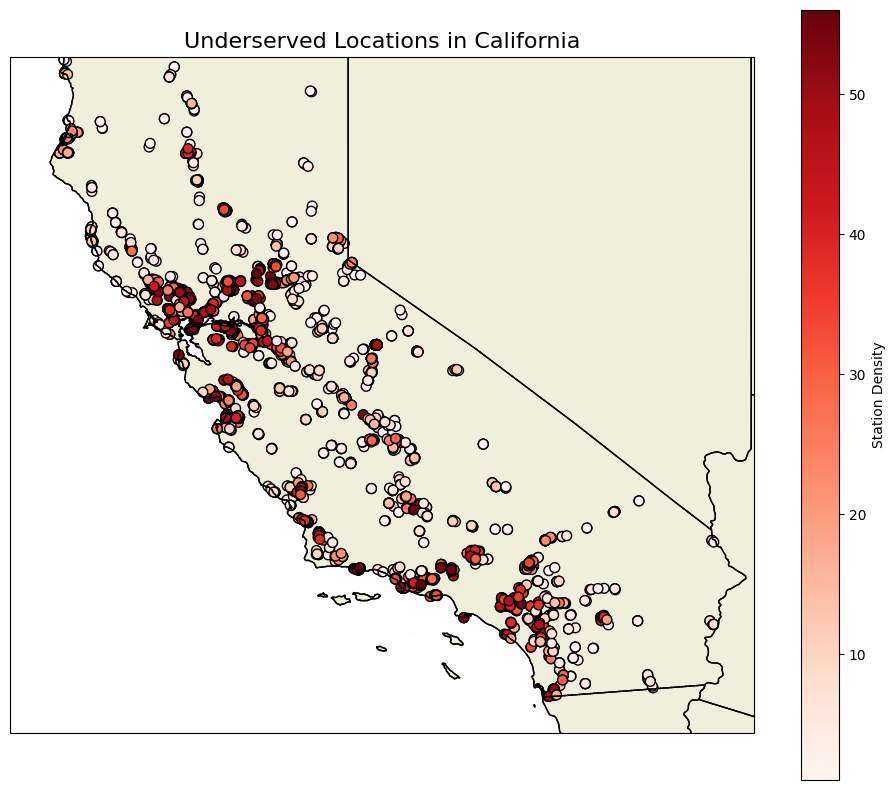

In [226]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Load underserved locations
file_path = "underserved_locations_california.csv"
df = pd.read_csv(file_path)

# Create a map
fig, ax = plt.subplots(figsize=(12, 10), subplot_kw={'projection': ccrs.PlateCarree()})
ax.set_extent([-125, -114, 32, 42], crs=ccrs.PlateCarree())  # California's bounding box

# Add features to the map
ax.add_feature(cfeature.LAND)
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.add_feature(cfeature.STATES, edgecolor='black')

# Plot underserved locations
scatter = ax.scatter(
    df['Longitude'], df['Latitude'], c=df['Station Density'], cmap='Reds',
    edgecolor='k', s=50, transform=ccrs.PlateCarree()
)
plt.colorbar(scatter, label="Station Density")
plt.title("Underserved Locations in California", fontsize=16)
plt.show()


#### Overlay Urban Center as point on map

In [227]:
import folium
from folium.plugins import MarkerCluster

# Load underserved locations and urban center data
stations_file = "underserved_locations_california.csv"
urban_centers_file = "Urban Centers.csv"

stations_df = pd.read_csv(stations_file)
urban_centers_df = pd.read_csv(urban_centers_file)

# Filter urban centers to California
urban_centers_df = urban_centers_df[urban_centers_df['State'] == 'CA']

# Create a Folium map centered around California
m = folium.Map(location=[36.7783, -119.4179], zoom_start=8)

# Add a marker cluster for underserved locations
underserved_cluster = MarkerCluster(name="Underserved Locations").add_to(m)

# Add markers for underserved locations
for _, row in stations_df.iterrows():
    popup_text = (f"Latitude: {row['Latitude']}<br>"
                  f"Longitude: {row['Longitude']}<br>"
                  f"Station Density: {row['Station Density']}<br>"
                  f"Cluster ID: {row['Underserved_Cluster']}")
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=folium.Popup(popup_text, max_width=300),
        icon=folium.Icon(color='red', icon='info-sign')
    ).add_to(underserved_cluster)

# Add urban centers as distinct markers
urban_center_layer = folium.FeatureGroup(name="Urban Centers")
for _, row in urban_centers_df.iterrows():
    popup_text = (f"Urban Center: {row['Place Name']}<br>"
                  f"Latitude: {row['Latitude']}<br>"
                  f"Longitude: {row['Longitude']}")
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=folium.Popup(popup_text, max_width=300),
        icon=folium.Icon(color='blue', icon='info-sign')
    ).add_to(urban_center_layer)

# Add the urban center layer to the map
urban_center_layer.add_to(m)

# Add layer control
folium.LayerControl().add_to(m)

# Save the map to an HTML file
output_path = "underserved_locations_with_urban_centers.html"
m.save(output_path)
print(f"Map saved to {output_path}")

# Display the map (optional in Jupyter Notebook)
m


Map saved to underserved_locations_with_urban_centers.html


## Improving the Model - Introducing additional features

### Introducing Population Density, Housing Density, Mean Income and Geographic Area

#### Data cleaning

In [197]:
income = pd.read_csv('C:/Users/gbooy/Downloads/EV Charging Data/Income/ACSST5Y2022.S1902-Data.csv').filter(['Geographic Area Name','Estimate!!Mean income (dollars)!!HOUSEHOLD INCOME!!All households'])
income.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33774 entries, 0 to 33773
Data columns (total 2 columns):
 #   Column                                                             Non-Null Count  Dtype 
---  ------                                                             --------------  ----- 
 0   Geographic Area Name                                               33774 non-null  object
 1   Estimate!!Mean income (dollars)!!HOUSEHOLD INCOME!!All households  33774 non-null  object
dtypes: object(2)
memory usage: 527.8+ KB


C:\Users\gbooy\AppData\Local\Temp\ipykernel_9104\3858934758.py:1: DtypeWarning: Columns (39,55,95) have mixed types. Specify dtype option on import or set low_memory=False.
  income = pd.read_csv('C:/Users/gbooy/Downloads/EV Charging Data/Income/ACSST5Y2022.S1902-Data.csv').filter(['Geographic Area Name','Estimate!!Mean income (dollars)!!HOUSEHOLD INCOME!!All households'])


In [202]:
income['Estimate!!Mean income (dollars)!!HOUSEHOLD INCOME!!All households'].replace('N', 0, inplace=True)
income['Estimate!!Mean income (dollars)!!HOUSEHOLD INCOME!!All households'].replace('-', 0, inplace=True)
convert_int = {'Estimate!!Mean income (dollars)!!HOUSEHOLD INCOME!!All households': int}
income = income.astype(convert_int)

income.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33774 entries, 0 to 33773
Data columns (total 3 columns):
 #   Column                                                             Non-Null Count  Dtype 
---  ------                                                             --------------  ----- 
 0   Geographic Area Name                                               33774 non-null  object
 1   Estimate!!Mean income (dollars)!!HOUSEHOLD INCOME!!All households  33774 non-null  int32 
 2   Mean Income($)                                                     33774 non-null  int32 
dtypes: int32(2), object(1)
memory usage: 527.8+ KB


In [129]:
homevalue = pd.read_csv('Housing Density.csv').filter(['Geographic Area Name','Estimate!!Total:','Estimate!!Total:!!$500,000 to $749,999','Estimate!!Total:!!$750,000 to $999,999','Estimate!!Total:!!$1,000,000 to $1,499,999','Estimate!!Total:!!$1,500,000 to $1,999,999','Estimate!!Total:!!$2,000,000 or more'])
homevalue.columns
homevalue.columns=['Area', 'Housing Density','500K-750k','750K-1M','1M-1.5M','1.5M-2M','Over2M']

In [130]:
population = pd.read_csv("Population Density.csv")  # Contains Latitude, Longitude, Population Density
population.columns

Index(['Geography', 'Geographic Area', 'Population Density'], dtype='object')

In [169]:
land_area = pd.read_csv('C:/Users/gbooy/Downloads/EV Charging Data/GEOINFO2023.GEOINFO-2024-11-16T132450.csv')
land_area['LandArea_SQMI'] = land_area['AREALAND_SQMI'].replace(',', '', regex=True).astype(float)
land_area.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33774 entries, 0 to 33773
Data columns (total 8 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   Geographic Area Name                   33774 non-null  object 
 1   Area Land in square meters             33774 non-null  int64  
 2   Area Water in square meters            33774 non-null  int64  
 3   AREALAND_SQMI                          33774 non-null  float64
 4   AREAWATR_SQMI                          33774 non-null  float64
 5   Internal Point (Latitude) (INTPTLAT)   33774 non-null  float64
 6   Internal Point (Longitude) (INTPTLON)  33774 non-null  object 
 7   LandArea_SQMI                          33774 non-null  float64
dtypes: float64(4), int64(2), object(2)
memory usage: 2.1+ MB


#### Merge dataset with existing EV station dataset

In [204]:
# Load station and population data
enhanced_station_df = califonia_station_df

population_df = population
housing_df = homevalue
income_df = income
land_area_df = land_area

# Merge population and housing data with station data based on location
enhanced_station_df['Population Density'] = population_df['Population Density']
enhanced_station_df['Housing Density'] = housing_df['Housing Density']
enhanced_station_df['LandArea_SQMI'] = land_area_df['AREALAND_SQMI']
enhanced_station_df['Mean Income($)'] = income_df['Estimate!!Mean income (dollars)!!HOUSEHOLD INCOME!!All households']

# Calculate new metrics
enhanced_station_df['Population to Station Ratio'] = enhanced_station_df['Population Density'] / (enhanced_station_df['Station Density'] + 1)


C:\Users\gbooy\AppData\Local\Temp\ipykernel_9104\4219543910.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  enhanced_station_df['Population Density'] = population_df['Population Density']
C:\Users\gbooy\AppData\Local\Temp\ipykernel_9104\4219543910.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  enhanced_station_df['Housing Density'] = housing_df['Housing Density']
C:\Users\gbooy\AppData\Local\Temp\ipykernel_9104\4219543910.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a 

In [205]:
# View the enhanced dataset
enhanced_station_df.head(2)

,ID,Station Name,Street Address,City,State,ZIP,EV Level1 EVSE Num,EV Level2 EVSE Num,EV DC Fast Count,EV Network,...,Nearest Station Name,Nearest Urban Center,Distance to Nearest Urban Center (km),Is_Underserved,Underserved_Cluster,Population Density,Housing Density,LandArea_SQMI,Mean Income($),Population to Station Ratio
0,1523,Los Angeles Convention Center,1201 S Figueroa St,Los Angeles,CA,ZCTA5 90015,NaN,7.0,NaN,Non-Networked,...,ESSEX AVANT STATION 2,"Downtown Los Angeles, CA, USA",2.089191,False,-1,17242.0,3740.0,64.421,23091.0,21.852978
1,6355,Scripps Green Hospital,10666 N Torrey Pines Rd,La Jolla,CA,ZCTA5 92037,NaN,1.0,NaN,Non-Networked,...,SCRIPPS HEALTH SCRIPPS TP,"La Jolla, CA, USA",6.464255,False,-1,37548.0,9630.0,30.327,28695.0,124.331126


## Predict New Station Locations

### With the addition of new features to enhance the dataset. We will attempt to identify underserved locations:
Population to Station Ratio, Population, Land Area (sqmi), Mean Income ($), Housing Density, Station Density, Distance to Nearest Station (km)

Target: Binary Classification: 1 for areas needing new stations, 0 otherwise.

### 1. Prepare the Dataset

In [213]:
# Predict underserved for all locations
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score

# Load the enhanced dataset
allserved_locations_df = enhanced_station_df

# Define features and target
features = [
    'Population to Station Ratio', 'Population Density', 'LandArea_SQMI', 
    'Mean Income($)', 'Station Density', 
    'Nearest Station Distance (km)', 'Housing Density'
]
target = 'Is_Underserved'

# Drop rows with missing values in relevant columns
allserved_locations_df = allserved_locations_df.dropna(subset=features + [target])

# Split the data into training and testing sets
X = allserved_locations_df[features]
y = allserved_locations_df[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.8, random_state=12)


### 3. Train a Machine Learning Model

In [214]:
# Train a Random Forest Classifier
rf_model = RandomForestClassifier(n_estimators=100, random_state=12)
rf_model.fit(X_train, y_train)

# Predict on the test set
y_pred = rf_model.predict(X_test)

# Evaluate the model
print("Accuracy:", accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))


Accuracy: 1.0
              precision    recall  f1-score   support

       False       1.00      1.00      1.00      5786
        True       1.00      1.00      1.00      1248

    accuracy                           1.00      7034
   macro avg       1.00      1.00      1.00      7034
weighted avg       1.00      1.00      1.00      7034



##### 
Despite splitting the dataset into 0.2 training and 0.8 test. The result confirms the same underserved locations as the DBSCAN model. Random Forest Classifier accurately predicted the same locations as the DBSCAN because the model is trained using the output of the DBSCAN to determine underserved locations.

### 4. Feature Importance

<Axes: title={'center': 'Feature Importance'}>

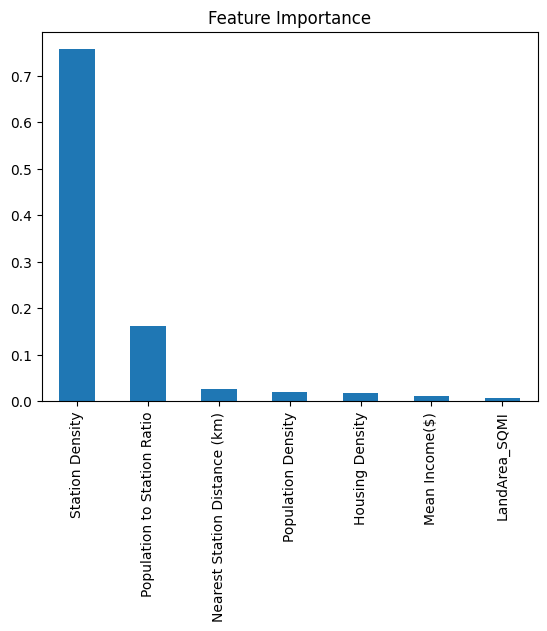

In [215]:
# Features most influential in predicting underserved areas
importances = pd.Series(rf_model.feature_importances_, index=features)
importances.sort_values(ascending=False).plot(kind='bar', title='Feature Importance')


##### 
We see that station density is most important feature in identifying underserved areas

In [223]:
# Predict underserved areas on the full dataset
allserved_locations_df['Predicted_Underserved'] = rf_model.predict(X)

# Filter for newly predicted underserved areas
new_locations = allserved_locations_df[(allserved_locations_df['Predicted_Underserved'] == 1) & (allserved_locations_df['Is_Underserved'] == 0)]


C:\Users\gbooy\AppData\Local\Temp\ipykernel_9104\1258973095.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  allserved_locations_df['Predicted_Underserved'] = rf_model.predict(X)


In [224]:
# Save the results
new_locations.to_csv("predicted_new_station_locations.csv", index=False)
print(f"New locations needing stations saved to 'predicted_new_station_locations.csv'")

New locations needing stations saved to 'predicted_new_station_locations.csv'
